In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import os

import arviz as az
import matplotlib.pyplot as plt
import neuromodels as nm
import numpy as np
import pandas as pd
import pylfi
import scipy.stats as stats
import seaborn as sns

from tqdm import tqdm_notebook as tqdm

[INFO] [2021.10.22 0:4:15 /Users/runner/miniforge3/conda-bld/nest-simulator_1633677025151/work/nestkernel/rng_manager.cpp:217 @ Network::create_rngs_] : Creating default RNGs
[INFO] [2021.10.22 0:4:15 /Users/runner/miniforge3/conda-bld/nest-simulator_1633677025151/work/nestkernel/rng_manager.cpp:260 @ Network::create_grng_] : Creating new default global RNG

              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: nest-2.20.2
 Built: Oct  8 2021 07:17:41

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.



In [2]:
# Set plot style
sns.set(context="paper", style='darkgrid', rc={"axes.facecolor": "0.96"})

# Set fontsizes in figures
size = 10
tex_fonts = {
    "text.usetex": True,
    "font.family": "serif",
    "font.sans-serif": ["Computer Modern"],
    "axes.labelsize": size,
    "font.size": size,
    "legend.fontsize": size,
    "xtick.labelsize": size-1,
    "ytick.labelsize": size-1,
    'legend.handlelength': 2
}

plt.rcParams.update(tex_fonts)
plt.rc('text', usetex=True)

# Set path to save the figures
FIGURE_PATH = "./../latex/figures" 
TABLE_PATH = "./../latex/tables" 

def fig_path(fig_id):
    """
    Input name of figure to load or save with extension as dtype str
    """
    return os.path.join(FIGURE_PATH + "/", fig_id)


def tab_path(tab_id):
    """
    Input name of table to load or save with extension as dtype str
    """
    return os.path.join(TABLE_PATH + "/", tab_id)


def df_to_latex(df, outfile):
    """
    Render dataframe to a LaTeX tabular environment table and write to file
    """
    n = len(df.columns)
    col_format = n * 'c'
    # Render dataframe to a LaTeX tabular environment table and write to file
    pd.options.display.float_format = '{:,.3f}'.format
    df = df.apply(lambda x: x.astype(
        int) if np.allclose(x, x.astype(int)) else x)
    pd.options.display.latex.escape = False
    latex = df.to_latex(index=False, column_format=col_format)
    latex = latex.replace('\\toprule', '\\hline \\hline')
    latex = latex.replace('\\midrule', '\\hline \\hline')
    latex = latex.replace('\\bottomrule', '\\hline \\hline')

    with open(tab_path(outfile), 'w') as f:
        f.write(latex)

# Set figure size
pt = 410 #360

def set_size(width, fraction=1):
    """Set figure dimensions to avoid scaling in LaTeX.

    Parameters
    ----------
    width: float
            Document textwidth or columnwidth in pts
    fraction: float, optional
            Fraction of the width which you wish the figure to occupy

    Returns
    -------
    fig_dim: tuple
            Dimensions of figure in inches
    """
    # Width of figure (in pts)
    fig_width_pt = width * fraction

    # Convert from pt to inches
    inches_per_pt = 1 / 72.27

    # Golden ratio to set aesthetic figure height
    # https://disq.us/p/2940ij3
    golden_ratio = (5**.5 - 1) / 2

    # Figure width in inches
    fig_width_in = fig_width_pt * inches_per_pt
    # Figure height in inches
    fig_height_in = fig_width_in * golden_ratio

    fig_dim = (fig_width_in, fig_height_in)

    return fig_dim

fs = set_size(pt, fraction=1)
print(fs)

(5.673170056731701, 3.5062119190183605)


## Observation

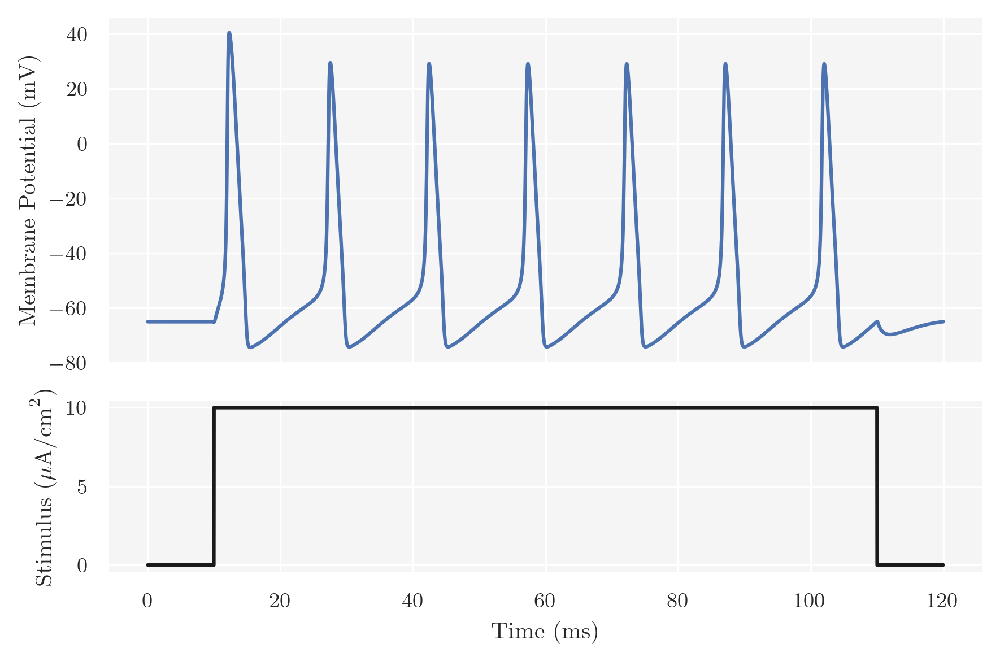

In [3]:
# Simulator model
T = 120           # Simulation time [ms]
dt = 0.025        # Time step [ms]
I_amp = 10        # Input stimuls amplitude [microA/cm^2]
t_stim_on = 10    # Stimulus onset [ms]
t_stim_off = 110  # Stimulus offset [ms]
stimulus = nm.stimulus.Constant(I_amp, t_stim_on, t_stim_off)
hh = nm.models.HodgkinHuxley(stimulus, T, dt)

# Summary statistics calculator
s_stats = ["average_AP_overshoot",
           "spike_rate",
           "average_AP_width",
           "average_AHP_depth",
           "latency_to_first_spike",
           "accommodation_index"
          ]

sps = nm.statistics.SpikeStats(t_stim_on=t_stim_on,
                               t_stim_off=t_stim_off,
                               stats=s_stats
                               )

# Observed data
gbarK0 = 36.
gbarNa0 = 120.

V, t = hh(gbar_K=gbarK0, gbar_Na=gbarNa0)

fig = hh.plot_voltage_trace(with_stim=True) 

fig.savefig(fig_path('hh_obs_data.pdf'), 
            format='pdf', 
            dpi=300, 
            bbox_inches='tight'
           )

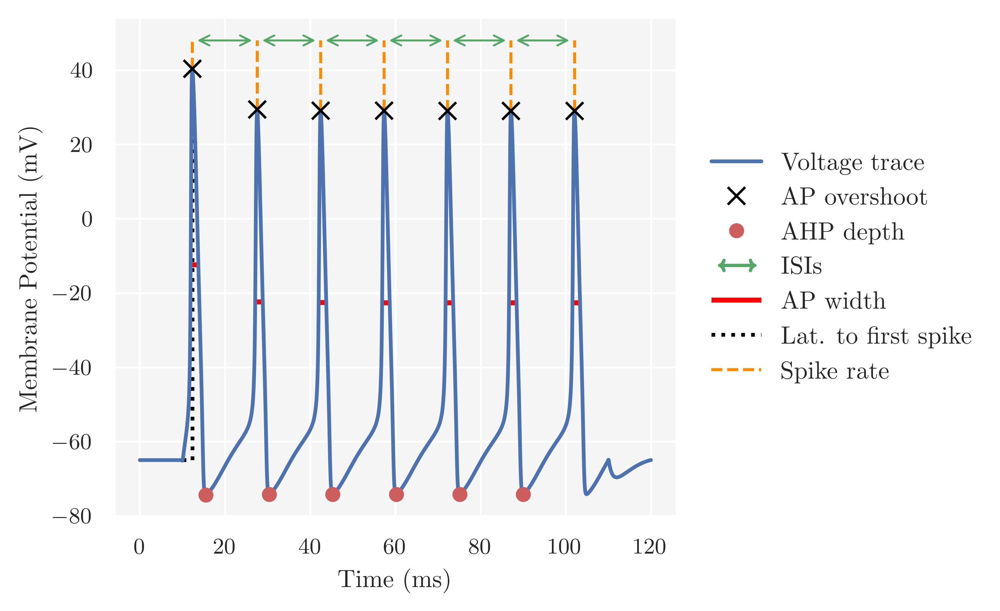

In [4]:
fig, ax = plt.subplots(figsize=fs, tight_layout=True, dpi=300)
hh.plot_spike_statistics2(t_stim_on, t_stim_off, ax=ax)

fig.savefig(fig_path('hh_stat_extraction.pdf'), 
            format='pdf', 
            dpi=300, 
            bbox_inches='tight'
           )

In [5]:
# number of spikes
n_spikes = sps.n_spikes(V, t)
print(f"{n_spikes=}")

# average AP overshoot
average_AP_overshoot = sps.average_AP_overshoot(V, t)
print(f"{average_AP_overshoot=:.4f} mV")

# spike rate
spike_rate = sps.spike_rate(V, t)
print(f"{spike_rate=:.4f} mHz")

# average AP width
average_AP_width = sps.average_AP_width(V, t)
print(f"{average_AP_width=:.4f} mV")

# average AHP depth
average_AHP_depth = sps.average_AHP_depth(V, t)
print(f"{average_AHP_depth=:.4f} mV")

# latency to first spike
latency_to_first_spike = sps.latency_to_first_spike(V, t)
print(f"{latency_to_first_spike=:.4f} ms")

# accommodation index
accommodation_index = sps.accommodation_index(V, t)
print(f"{accommodation_index=:.17f}")

n_spikes=7
average_AP_overshoot=30.7316 mV
spike_rate=0.0700 mHz
average_AP_width=2.0501 mV
average_AHP_depth=-74.2234 mV
latency_to_first_spike=2.3000 ms
accommodation_index=0.00000000000000002


## Priors

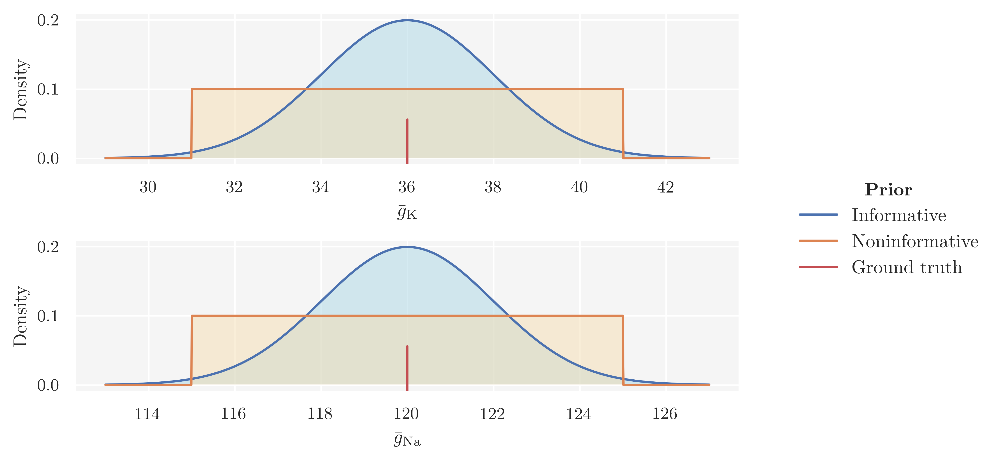

In [6]:
gbarK_n = pylfi.Prior('norm',
                    loc=gbarK0,
                    scale=2,
                    name='gbarK',
                    tex=r"$\bar{g}_\mathrm{K}$"
                    )

gbarNa_n = pylfi.Prior('norm',
                     loc=gbarNa0,
                     scale=2,
                     name='gbarNa',
                     tex=r"$\bar{g}_\mathrm{Na}$"
                     )

gbarK_u = pylfi.Prior('uniform',
                    loc=31,
                    scale=10,
                    name='gbarK',
                    tex=r"$\bar{g}_\mathrm{K}$"
                    )

gbarNa_u = pylfi.Prior('uniform',
                     loc=115,
                     scale=10,
                     name='gbarNa',
                     tex=r"$\bar{g}_\mathrm{Na}$"
                     )

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=fs, tight_layout=True, dpi=300)

ax = axes[0]
x = np.linspace(29, 43, 1000)
gbarK_n.plot_prior(x, label='Informative', ax=ax)
gbarK_u.plot_prior(x, color='C1', facecolor='wheat', label='Noninformative', ax=ax)
ax.axvline(36.0, ymax=0.3, color='r', label='Ground truth')
#ax.legend(loc='upper right')

ax2 = axes[1]
x = np.linspace(113, 127, 1000)
gbarNa_n.plot_prior(x, label='Informative', ax=ax2)
gbarNa_u.plot_prior(x, color='C1', facecolor='wheat', label='Noninformative', ax=ax2)
ax2.axvline(120.0, ymax=0.3, color='r', label='Ground truth')
#ax2.legend(loc='upper right')

handles, labels = ax.get_legend_handles_labels()

fig.legend(handles,
          labels,
          loc='center left',
          bbox_to_anchor=(1.04, 0.5),
          fancybox=True,
          borderaxespad=0.1,
          frameon=False,
          title=r"\textbf{Prior}",
          ncol=1
         )

fig.savefig(fig_path('hh_priors.pdf'), 
            format='pdf', 
            dpi=300, 
            bbox_inches='tight'
           )

## Deeper look into sum stats

### Informative prior

In [13]:
df = pd.read_csv('data/sum_stats_prior_pred_normal.csv')
df

,gbarK,gbarNa,average_AP_overshoot,spike_rate,average_AP_width,average_AHP_depth,latency_to_first_spike,accommodation_index
0,35.342626,119.533543,30.959114,0.07,2.023342,-74.182689,2.100,-7.238134e-17
1,37.623712,122.619393,30.503909,0.07,2.101034,-74.331103,2.200,2.325835e-17
2,34.499300,122.510282,32.076527,0.07,2.056448,-74.162209,2.250,-2.484991e-17
3,31.826958,120.875220,32.520720,0.08,2.238363,-73.967603,2.175,4.297055e-17
4,35.843239,118.568884,30.392667,0.07,2.021030,-74.200228,2.250,1.670844e-04
...,...,...,...,...,...,...,...,...
1909,32.696269,121.369764,32.272972,0.08,2.261995,-74.032417,2.200,-1.494768e-04
1910,37.715541,121.332758,30.002544,0.07,2.072743,-74.322054,2.200,4.590512e-17
1911,35.611438,120.682442,31.126432,0.07,2.056809,-74.208700,2.100,-7.237401e-17
1912,34.773891,121.688324,31.775265,0.07,2.041016,-74.170958,2.175,0.000000e+00


In [14]:
df = pd.read_csv('data/sum_stats_prior_pred_normal.csv')
df = df.iloc[:len(df.index)//4]  # plot subset only
df.rename(columns={"gbarK": r"$\bar{g}_\mathrm{K}$",
                 "gbarNa": r"$\bar{g}_\mathrm{Na}$",
                 "spike_rate": "Spike rate",
                 "latency_to_first_spike": "Lat. to first spike",
                 "average_AP_overshoot": "Avg. AP overshoot",
                 "average_AHP_depth": "Avg. AHP depth",
                 "average_AP_width": "Avg. AP width", 
                 "accommodation_index" : "Accomm. index"
          },
 inplace=True
         )

df

,$\bar{g}_\mathrm{K}$,$\bar{g}_\mathrm{Na}$,Avg. AP overshoot,Spike rate,Avg. AP width,Avg. AHP depth,Lat. to first spike,Accomm. index
0,35.342626,119.533543,30.959114,0.07,2.023342,-74.182689,2.100,-7.238134e-17
1,37.623712,122.619393,30.503909,0.07,2.101034,-74.331103,2.200,2.325835e-17
2,34.499300,122.510282,32.076527,0.07,2.056448,-74.162209,2.250,-2.484991e-17
3,31.826958,120.875220,32.520720,0.08,2.238363,-73.967603,2.175,4.297055e-17
4,35.843239,118.568884,30.392667,0.07,2.021030,-74.200228,2.250,1.670844e-04
...,...,...,...,...,...,...,...,...
473,32.375787,117.296055,31.437891,0.08,2.209604,-73.970951,2.200,2.960325e-04
474,31.758620,120.348764,32.440301,0.08,2.232801,-73.957728,2.200,4.298504e-17
475,36.736769,118.459299,29.736853,0.07,2.035872,-74.245034,2.225,-2.315856e-17
476,37.504726,115.586085,27.154352,0.07,1.974916,-74.240098,2.275,3.039514e-04


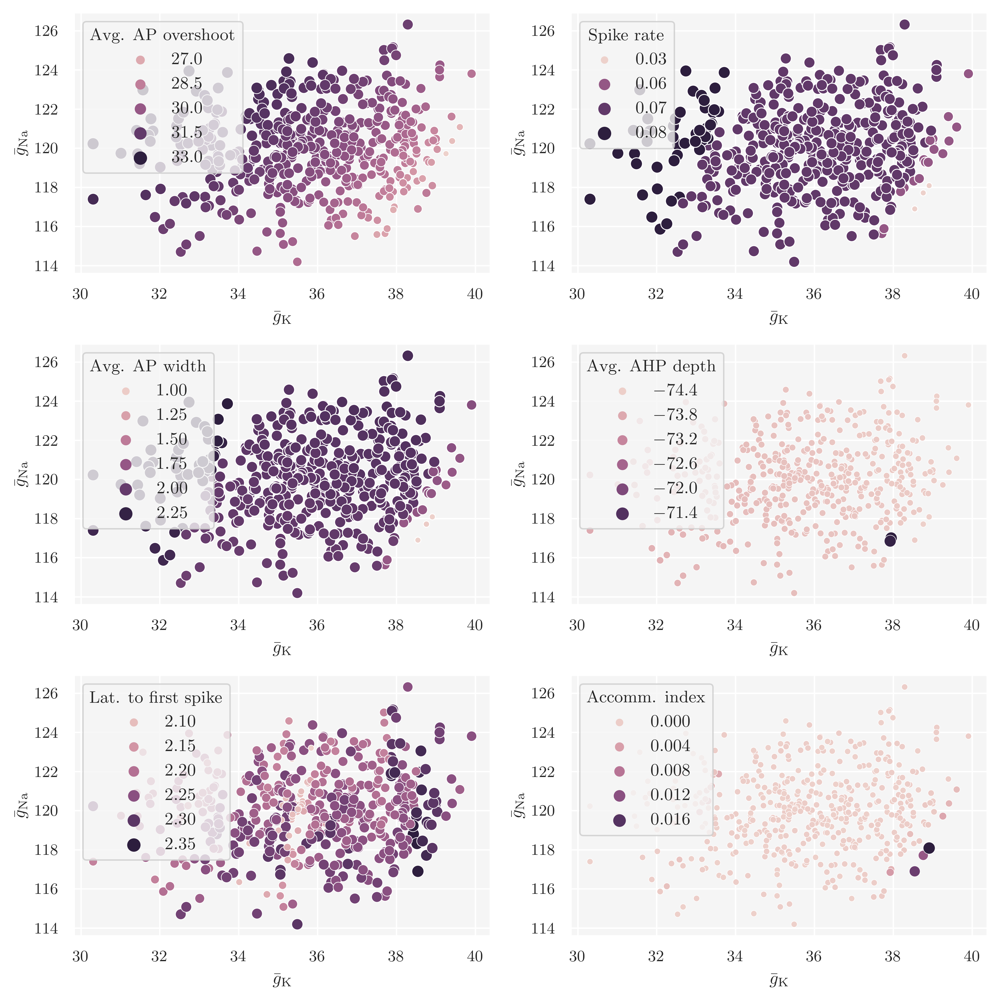

In [15]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(8, 8), tight_layout=True, dpi=300)

# AP overshoot
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Avg. AP overshoot",
                size="Avg. AP overshoot",
                #sizes=(10, 100),
                ax=axes[0, 0]
               )


# Spike rate
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Spike rate",
                size="Spike rate",
                #sizes=(10, 100),
                ax=axes[0, 1]
               )

# AP width
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Avg. AP width",
                size="Avg. AP width",
                #sizes=(1, 50),
                ax=axes[1, 0]
               )

# AHP depth
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Avg. AHP depth",
                size="Avg. AHP depth",
                #sizes=(10, 100),
                ax=axes[1, 1]
               )

# Lat. to first spike
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Lat. to first spike",
                size="Lat. to first spike",
                #sizes=(10, 100),
                ax=axes[2, 0]
               )

# Accomm. index
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Accomm. index",
                size="Accomm. index",
                ax=axes[2, 1]
               )

fig.savefig(fig_path('hh_priorpred_sstats_normal.pdf'), 
            format='pdf', 
            dpi=300, 
            bbox_inches='tight'
           )

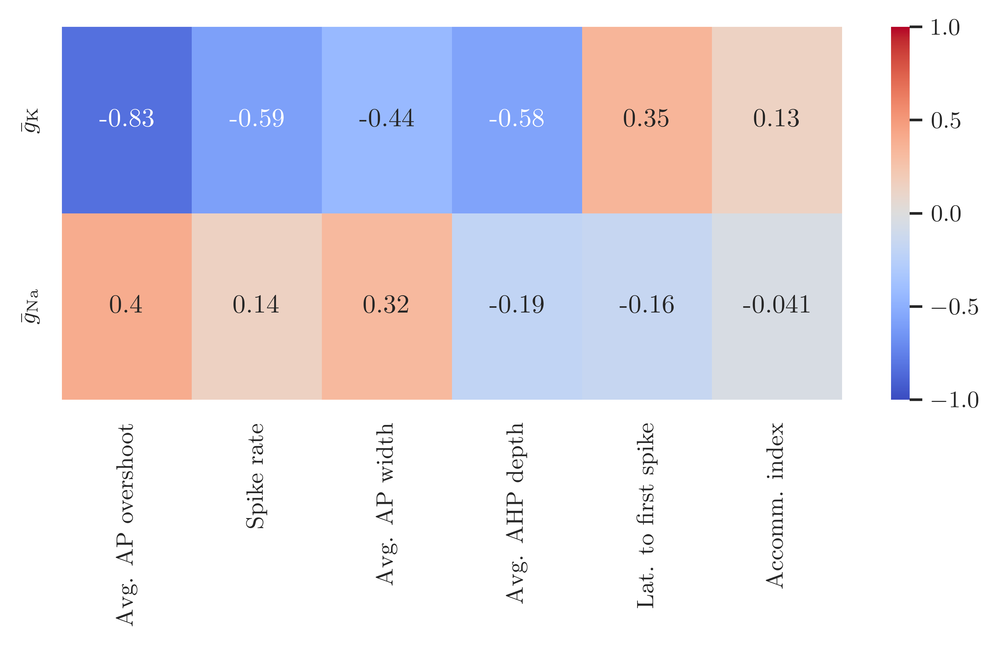

In [16]:
df = pd.read_csv('data/sum_stats_prior_pred_normal.csv')
df.rename(columns={"gbarK": r"$\bar{g}_\mathrm{K}$",
                 "gbarNa": r"$\bar{g}_\mathrm{Na}$",
                 "spike_rate": "Spike rate",
                 "latency_to_first_spike": "Lat. to first spike",
                 "average_AP_overshoot": "Avg. AP overshoot",
                 "average_AHP_depth": "Avg. AHP depth",
                 "average_AP_width": "Avg. AP width", 
                 "accommodation_index" : "Accomm. index"
          },
 inplace=True
         )

corr = df.corr()

corr.drop(r"$\bar{g}_\mathrm{K}$", axis=1, inplace=True)
corr.drop(r"$\bar{g}_\mathrm{Na}$", axis=1, inplace=True)
corr.drop("Spike rate", axis=0, inplace=True)
corr.drop("Lat. to first spike", axis=0, inplace=True)
corr.drop("Avg. AP overshoot", axis=0, inplace=True)
corr.drop("Avg. AHP depth", axis=0, inplace=True)
corr.drop("Avg. AP width", axis=0, inplace=True)
corr.drop("Accomm. index", axis=0, inplace=True)

fig, ax = plt.subplots(figsize=fs, tight_layout=True, dpi=300)
sns.heatmap(corr, ax=ax, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

fig.savefig(fig_path('hh_priorpred_corr_normal.pdf'), 
            format='pdf', 
            dpi=300, 
            bbox_inches='tight'
           )

In [17]:
df_weights = pd.read_csv('data/sumstat_weights_normal.csv', index_col=0)
df_weights /= df_weights["Weight"].sum()
df_weights.rename(index={"spike_rate": "Spike rate",
                 "latency_to_first_spike": "Lat. to first spike",
                 "average_AP_overshoot": "Avg. AP overshoot",
                 "average_AHP_depth": "Avg. AHP depth",
                 "average_AP_width": "Avg. AP width", 
                 "accommodation_index" : "Accomm. index"
          },
 inplace=True
         )

df_weights

,Weight
Avg. AP overshoot,0.416580
Spike rate,0.178167
Avg. AP width,0.144332
Avg. AHP depth,0.179457
Lat. to first spike,0.071914
Accomm. index,0.009550


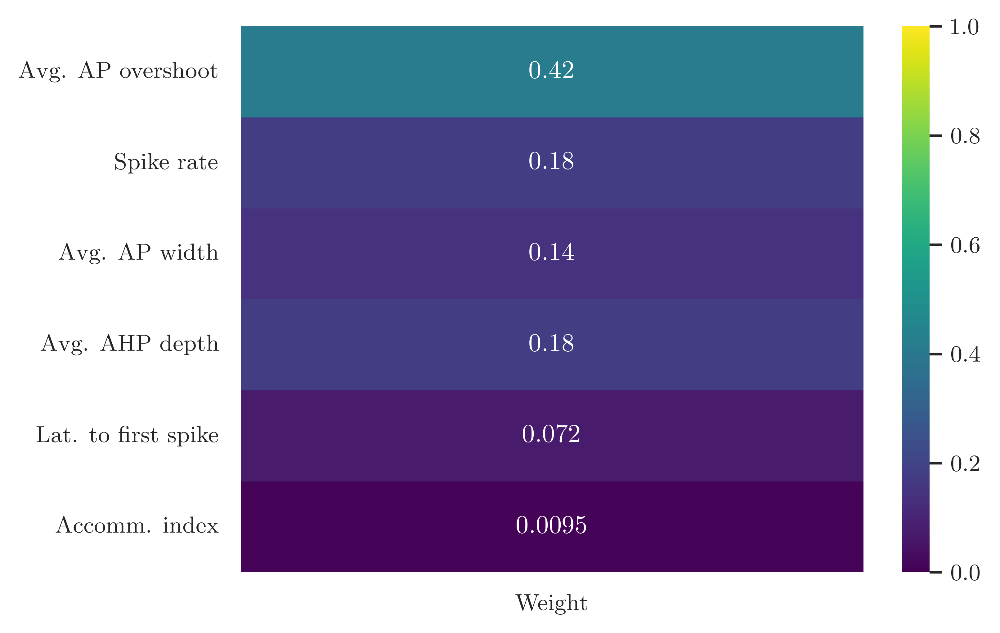

In [18]:
fig, ax = plt.subplots(figsize=fs, tight_layout=True, dpi=300)
sns.heatmap(df_weights, ax=ax, annot=True, cmap='viridis', vmin=0, vmax=1)

fig.savefig(fig_path('hh_priorpred_weights_normal.pdf'), 
            format='pdf', 
            dpi=300, 
            bbox_inches='tight'
           )

### Noninformative prior

In [19]:
df = pd.read_csv('data/sum_stats_priorpred_uniform.csv')
df

,gbarK,gbarNa,average_AP_overshoot,spike_rate,average_AP_width,average_AHP_depth,latency_to_first_spike,accommodation_index
0,34.765320,118.074595,30.860907,0.07,2.010183,-74.135152,2.275,-1.707942e-04
1,40.077433,123.459350,28.128758,0.06,1.820701,-74.440626,2.250,1.845018e-04
2,32.425816,119.489284,31.953380,0.08,2.239488,-73.996277,2.225,-6.366870e-17
3,31.401269,121.141030,32.715326,0.08,2.231409,-73.939443,2.150,-7.135517e-21
4,38.832479,121.679819,28.995136,0.07,2.070776,-74.372229,2.300,1.554002e-04
...,...,...,...,...,...,...,...,...
1708,40.362795,123.625358,26.797239,0.06,1.774450,-74.440901,2.225,1.949001e-03
1709,38.336182,122.681301,29.966997,0.07,2.069880,-74.364050,2.225,-4.554761e-17
1710,36.015063,123.950946,31.760601,0.07,2.075562,-74.261776,2.100,-1.710864e-04
1711,33.815270,124.257031,32.405471,0.08,2.303362,-74.131179,2.175,2.955062e-04


In [20]:
df = pd.read_csv('data/sum_stats_priorpred_uniform.csv')
df = df.iloc[:len(df.index)//4]  # plot subset only
df.rename(columns={"gbarK": r"$\bar{g}_\mathrm{K}$",
                 "gbarNa": r"$\bar{g}_\mathrm{Na}$",
                 "spike_rate": "Spike rate",
                 "latency_to_first_spike": "Lat. to first spike",
                 "average_AP_overshoot": "Avg. AP overshoot",
                 "average_AHP_depth": "Avg. AHP depth",
                 "average_AP_width": "Avg. AP width", 
                 "accommodation_index" : "Accomm. index"
          },
 inplace=True
         )

df

,$\bar{g}_\mathrm{K}$,$\bar{g}_\mathrm{Na}$,Avg. AP overshoot,Spike rate,Avg. AP width,Avg. AHP depth,Lat. to first spike,Accomm. index
0,34.765320,118.074595,30.860907,0.07,2.010183,-74.135152,2.275,-1.707942e-04
1,40.077433,123.459350,28.128758,0.06,1.820701,-74.440626,2.250,1.845018e-04
2,32.425816,119.489284,31.953380,0.08,2.239488,-73.996277,2.225,-6.366870e-17
3,31.401269,121.141030,32.715326,0.08,2.231409,-73.939443,2.150,-7.135517e-21
4,38.832479,121.679819,28.995136,0.07,2.070776,-74.372229,2.300,1.554002e-04
...,...,...,...,...,...,...,...,...
423,31.267331,116.447302,31.782761,0.08,2.188686,-73.883337,2.225,-1.505573e-04
424,38.555172,116.951948,28.268769,0.03,0.988769,-74.384219,2.350,1.404494e-02
425,35.223676,118.131162,30.633589,0.07,2.015882,-74.161743,2.125,-1.690617e-04
426,39.218634,124.964393,30.071084,0.07,2.125032,-74.424755,2.250,-6.756748e-17


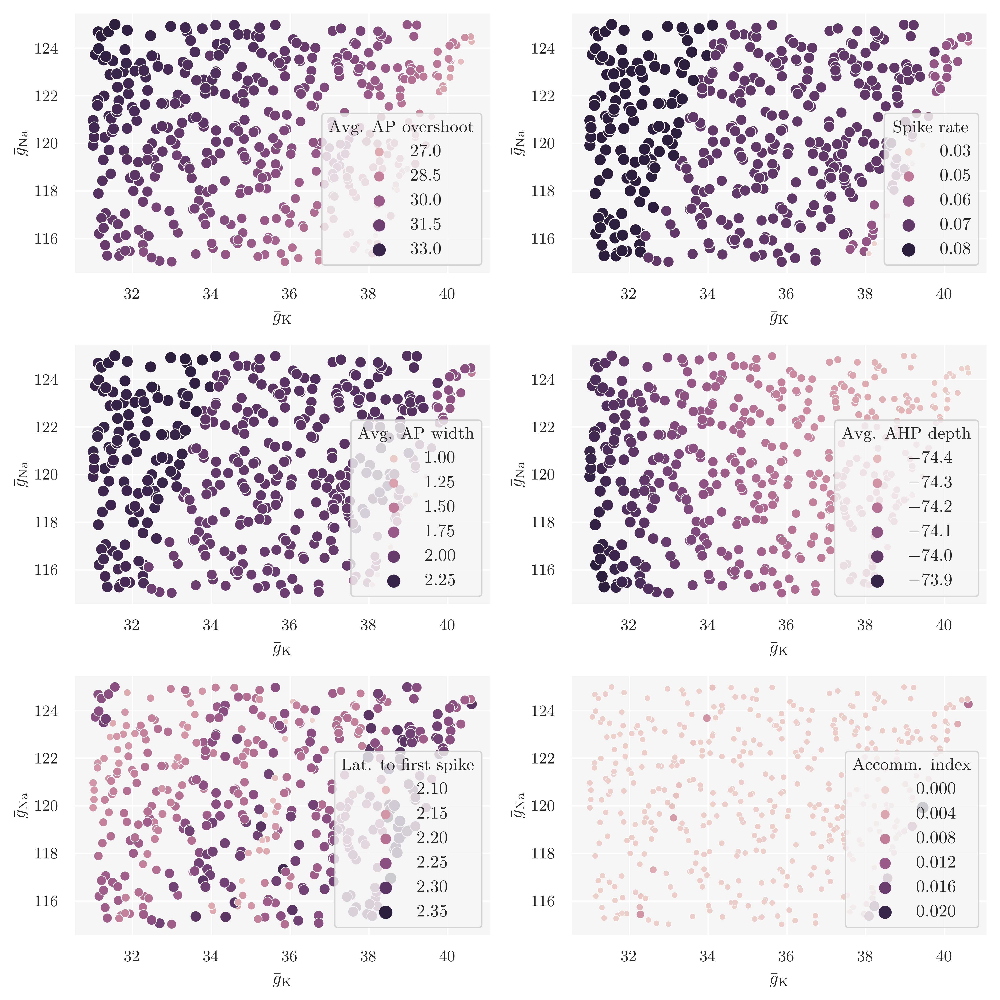

In [21]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(8, 8), tight_layout=True, dpi=300)

# AP overshoot
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Avg. AP overshoot",
                size="Avg. AP overshoot",
                #sizes=(10, 100),
                ax=axes[0, 0]
               )


# Spike rate
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Spike rate",
                size="Spike rate",
                #sizes=(10, 100),
                ax=axes[0, 1]
               )

# AP width
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Avg. AP width",
                size="Avg. AP width",
                #sizes=(1, 50),
                ax=axes[1, 0]
               )

# AHP depth
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Avg. AHP depth",
                size="Avg. AHP depth",
                #sizes=(10, 100),
                ax=axes[1, 1]
               )

# Lat. to first spike
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Lat. to first spike",
                size="Lat. to first spike",
                #sizes=(10, 100),
                ax=axes[2, 0]
               )

# Accomm. index
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Accomm. index",
                size="Accomm. index",
                ax=axes[2, 1]
               )

fig.savefig(fig_path('hh_priorpred_sstats_uniform.pdf'), 
            format='pdf', 
            dpi=300, 
            bbox_inches='tight'
           )

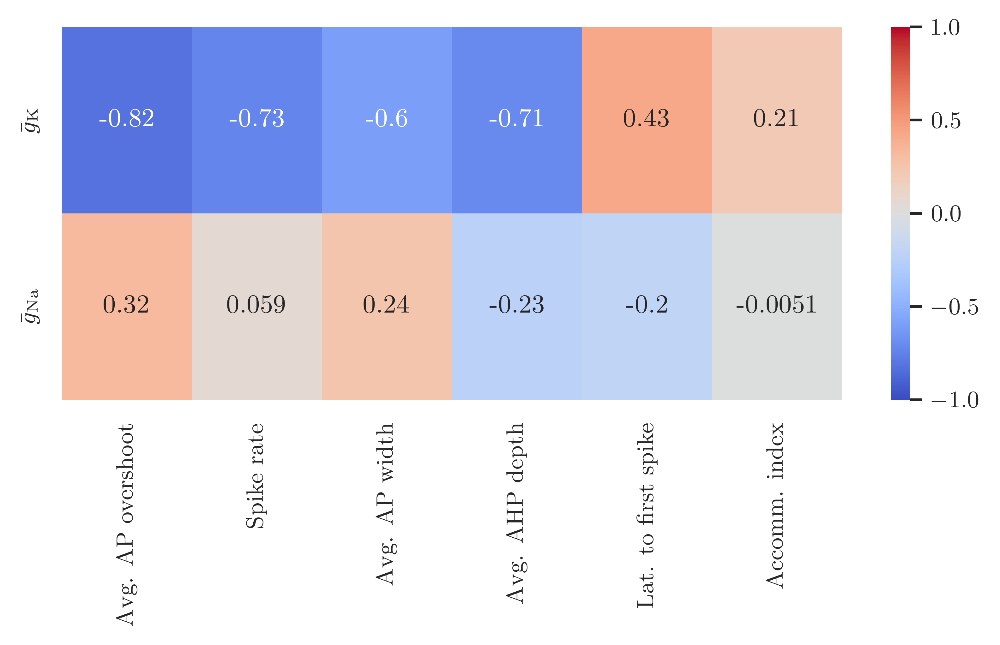

In [22]:
df = pd.read_csv('data/sum_stats_priorpred_uniform.csv')
df.rename(columns={"gbarK": r"$\bar{g}_\mathrm{K}$",
                 "gbarNa": r"$\bar{g}_\mathrm{Na}$",
                 "spike_rate": "Spike rate",
                 "latency_to_first_spike": "Lat. to first spike",
                 "average_AP_overshoot": "Avg. AP overshoot",
                 "average_AHP_depth": "Avg. AHP depth",
                 "average_AP_width": "Avg. AP width", 
                 "accommodation_index" : "Accomm. index"
          },
 inplace=True
         )

corr = df.corr()

corr.drop(r"$\bar{g}_\mathrm{K}$", axis=1, inplace=True)
corr.drop(r"$\bar{g}_\mathrm{Na}$", axis=1, inplace=True)
corr.drop("Spike rate", axis=0, inplace=True)
corr.drop("Lat. to first spike", axis=0, inplace=True)
corr.drop("Avg. AP overshoot", axis=0, inplace=True)
corr.drop("Avg. AHP depth", axis=0, inplace=True)
corr.drop("Avg. AP width", axis=0, inplace=True)
corr.drop("Accomm. index", axis=0, inplace=True)

fig, ax = plt.subplots(figsize=fs, tight_layout=True, dpi=300)
sns.heatmap(corr, ax=ax, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

fig.savefig(fig_path('hh_priorpred_corr_uniform.pdf'), 
            format='pdf', 
            dpi=300, 
            bbox_inches='tight'
           )

In [23]:
df_weights = pd.read_csv('data/sumstat_weights_uniform.csv', index_col=0)
df_weights /= df_weights["Weight"].sum()
df_weights.rename(index={"spike_rate": "Spike rate",
                 "latency_to_first_spike": "Lat. to first spike",
                 "average_AP_overshoot": "Avg. AP overshoot",
                 "average_AHP_depth": "Avg. AHP depth",
                 "average_AP_width": "Avg. AP width", 
                 "accommodation_index" : "Accomm. index"
          },
 inplace=True
         )
df_weights

,Weight
Avg. AP overshoot,0.304091
Spike rate,0.210326
Avg. AP width,0.163078
Avg. AHP depth,0.218068
Lat. to first spike,0.086408
Accomm. index,0.018029


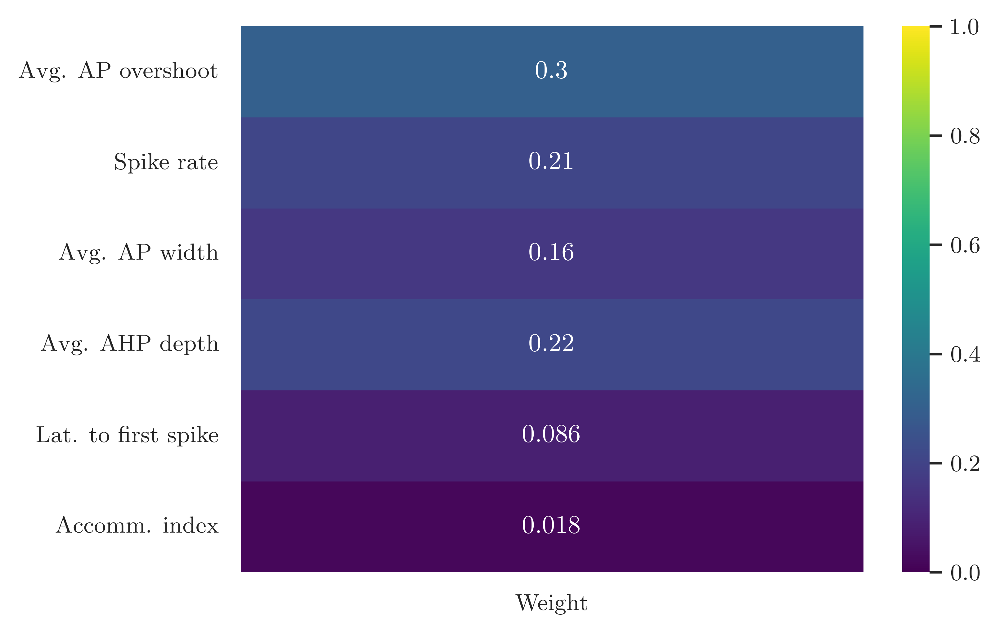

In [24]:
fig, ax = plt.subplots(figsize=fs, tight_layout=True, dpi=300)
sns.heatmap(df_weights, ax=ax, annot=True, cmap='viridis', vmin=0, vmax=1)

fig.savefig(fig_path('hh_priorpred_weights_uniform.pdf'), 
            format='pdf', 
            dpi=300, 
            bbox_inches='tight'
           )

## Drop this?

In [ ]:
N = 200
gbar_K_fixed = 36
gbar_Na_fixed = 120 

gbar_Ks = np.linspace(30, 40, N)
gbar_Nas = np.linspace(115, 125, N)

stats_data_gbar_K = {stat: [] for stat in s_stats}
for gbar_K in tqdm(gbar_Ks):
    V, t = hh(gbar_K, gbar_Na_fixed)
    sum_stats = sps(V, t)
    for i, key in enumerate(stats_data_gbar_K):
        stats_data_gbar_K[key].append(sum_stats[i])

In [ ]:
stats_data_gbar_Na = {stat: [] for stat in s_stats}

for gbar_Na in tqdm(gbar_Nas):
    V, t = hh(gbar_K_fixed, gbar_Na)
    sum_stats = sps(V, t)
    for i, key in enumerate(stats_data_gbar_Na):
        stats_data_gbar_Na[key].append(sum_stats[i])

In [ ]:
df_gbarK = pd.DataFrame.from_dict(stats_data_gbar_K)
df_gbarK["gbarK"] = gbar_Ks

df_gbarK.rename(columns={"gbarK": r"$\bar{g}_\mathrm{K}$",
                 "spike_rate": "Spike rate",
                 "latency_to_first_spike": "Lat. to first spike",
                 "average_AP_overshoot": "Avg. AP overshoot",
                 "average_AHP_depth": "Avg. AHP depth",
                 "average_AP_width": "Avg. AP width", 
                 "accommodation_index" : "Accomm. index"
          },
 inplace=True
         )

df_gbarK

In [ ]:
df_gbarNa = pd.DataFrame.from_dict(stats_data_gbar_Na)
df_gbarNa["gbarNa"] = gbar_Nas

df_gbarNa.rename(columns={"gbarNa": r"$\bar{g}_\mathrm{Na}$",
                 "spike_rate": "Spike rate",
                 "latency_to_first_spike": "Lat. to first spike",
                 "average_AP_overshoot": "Avg. AP overshoot",
                 "average_AHP_depth": "Avg. AHP depth",
                 "average_AP_width": "Avg. AP width", 
                 "accommodation_index" : "Accomm. index"
          },
 inplace=True
         )

df_gbarNa

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=fs, tight_layout=True, dpi=300)

# AP overshoot
sns.scatterplot(data=df_gbarK, 
                x=r"$\bar{g}_\mathrm{K}$",  
                y="Avg. AP overshoot",
                ax=axes[0, 0],
               )


sns.scatterplot(data=df_gbarNa, 
                x=r"$\bar{g}_\mathrm{Na}$",  
                y="Avg. AP overshoot",
                color="C1",
                ax=axes[0, 1]
               )

# Spike rate
sns.scatterplot(data=df_gbarK, 
                x=r"$\bar{g}_\mathrm{K}$",  
                y="Spike rate",
                ax=axes[1, 0],
               )


sns.scatterplot(data=df_gbarNa, 
                x=r"$\bar{g}_\mathrm{Na}$",  
                y="Spike rate",
                color="C1",
                ax=axes[1, 1]
               )

axes[0, 0].set(title=r'$\bar{g}_\mathrm{Na}=120.0$')
axes[0, 1].set(title=r'$\bar{g}_\mathrm{K}=36.0$')



s_stats_all = ["average_AP_overshoot",
               "spike_rate",
               "average_AP_width",
               "average_AHP_depth",
               "latency_to_first_spike",
               "accommodation_index"]

plt.show()

## Playground

In [ ]:
df = pd.read_csv('data/sum_stats_priorpred_uniform.csv')
df = df.iloc[:len(df.index)//3]
df.rename(columns={"gbarK": r"$\bar{g}_\mathrm{K}$",
                 "gbarNa": r"$\bar{g}_\mathrm{Na}$",
                 "spike_rate": "Spike rate",
                 "latency_to_first_spike": "Lat. to first spike",
                 "average_AP_overshoot": "Avg. AP overshoot",
                 "average_AHP_depth": "Avg. AHP depth",
                 "average_AP_width": "Avg. AP width", 
                 "accommodation_index" : "Accomm. index"
          },
 inplace=True
         )
df

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=fs, tight_layout=True, dpi=300)

# AP overshoot
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$",  
                y="Avg. AP overshoot",
                ax=axes[0, 0]
               )
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{Na}$",  
                y="Avg. AP overshoot",
                color="C1",
                ax=axes[0, 1]
               ) 

sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Avg. AP overshoot",
                size="Avg. AP overshoot",
                sizes=(10, 100),
                ax=axes[0, 2]
               )

axes[0, 1].set(yticks=[], ylabel='')

# Spike rate
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$",  
                y="Avg. AP width",
                ax=axes[1, 0]
               )

sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{Na}$",  
                y="Avg. AP width",
                color="C1",
                ax=axes[1, 1]
               ) 

sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Avg. AP width",
                size="Avg. AP width",
                sizes=(10, 100),
                ax=axes[1, 2]
               )

axes[1, 1].set(yticks=[], ylabel='')

plt.show()

In [ ]:
s_stats_all = ["average_AP_overshoot",
               "spike_rate",
               "average_AP_width",
               "average_AHP_depth",
               "latency_to_first_spike",
               "accommodation_index"]

In [ ]:
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                y=r"$\bar{g}_\mathrm{Na}$", 
                hue="Avg. AP overshoot",
                size="Avg. AP overshoot",
                sizes=(10, 100),
                ax=axes[2]
               )
plt.show()

In [ ]:
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$", 
                #y=r"$\bar{g}_\mathrm{Na}$", 
                y="Avg. AP overshoot",
                #size="Avg. AP overshoot",
                #sizes=(10, 100),
                #ax=axes[0]
               )
plt.show()

In [ ]:
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{Na}$", 
                #y=r"$\bar{g}_\mathrm{Na}$", 
                y="Avg. AP overshoot",
                #sizes=(10, 100),
                #ax=axes[0]
               )
plt.show()

In [ ]:
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{K}$",  
                y="Spike rate",
                #ax=axes[2]
               )


In [ ]:
sns.scatterplot(data=df, 
                x=r"$\bar{g}_\mathrm{Na}$",  
                y="Spike rate",
                color="C1",
               # ax=axes[3]
               ) 